In [1]:
### Import libraries ###
import pandas as pd
from pandas.api.types import CategoricalDtype
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import geopandas as gpd
import contextily as cx
import mapclassify
import csv
import palettable
import folium

plt.style.use('default')
# This next line tells jupyter to render the images inline
%matplotlib inline
import matplotlib_inline
# This renders your figures as vector graphics AND gives you an option to download a PDF too
matplotlib_inline.backend_inline.set_matplotlib_formats('svg', 'pdf')

In [2]:
### Set Date to Plot ###

investigate_date = "2022-01-13" ##Bad Air day from initial explore of dataset -- solid East/West discrepancy
#investigate_date = "2023-09-01" ##Dust Day from Trib Article -- ugh. Perfect air
#investigate_date = '2022-01-11' ##Inversion day from my photos. Air not great, but yellow all around. Possibly better on the west side?
#investigate_date = '2021-08-05' ## possibly a solid example of west/east discrepancy a day before the bad smoke came into town
#investigate_date = '2023-05-10'


In [13]:
### Tony's Code ###

slc_zcta_list_path = './zcta_data/slc_zcta.csv'

slc_zcta_list = []

with open(slc_zcta_list_path, newline='') as csvfile:
    reader = csv.reader(csvfile, delimiter=',')
    for row in reader:
        int_row = [int(i) for i in row]
        slc_zcta_list.append(int_row)
        
slc_zcta_list = [item for sublist in slc_zcta_list for item in sublist]

# Load the shapefile
slc_shapefile_path = 'zcta_data/slc_zcta.shp'
slc_gdf = gpd.read_file(slc_shapefile_path)

# Load the race population data
race_pop_path = './data/census_data/race_pop_by_latino_df.csv'
race_pop_df = pd.read_csv(race_pop_path)
race_pop_df = race_pop_df[race_pop_df['ZCTA5'].isin(slc_zcta_list)]
# df.columns = race_pop_df.columns.str.replace('\t', '')
race_pop_df.columns = race_pop_df.columns.str.strip()
race_pop_df = race_pop_df.replace(',','', regex=True)
race_pop_df = race_pop_df.astype(int)
race_pop_df = race_pop_df.reset_index(drop=True)

# nonwhite_race = ['Hispanic or Latino', 'Black or African American alone', 'American Indian and Alaska Native alone', 'Asian alone', 'Native Hawaiian and Other Pacific Islander alone', 'Some Other Race alone', 'Population of two races:', 'Population of three races:', 'Population of four races:', 'Population of five races:', 'Population of six races:']

race_pop_df['Perc_Hispanic_Latino'] = round((race_pop_df['Hispanic or Latino'] / race_pop_df['Total:'])*100, 1)
race_pop_df['Perc_Black'] = round((race_pop_df['Black or African American alone'] / race_pop_df['Total:'])*100, 1)
race_pop_df['Perc_NonWhite'] = round(((race_pop_df['Total:'] - race_pop_df['White alone']) / race_pop_df['Total:'])*100, 1)

race_pop_gdf = slc_gdf.merge(race_pop_df, left_on='ZCTA5', right_on='ZCTA5')

# Load the median household income data
median_hh_income_path = './data/census_data/median_hh_income_df.csv'
median_hh_income_df = pd.read_csv(median_hh_income_path)
median_hh_income_df = median_hh_income_df[median_hh_income_df['ZCTA5'].isin(slc_zcta_list)]
median_hh_income_df.columns = median_hh_income_df.columns.str.strip()
median_hh_income_df = median_hh_income_df.replace(',','', regex=True)
median_hh_income_df = median_hh_income_df.replace('-', np.nan)
median_hh_income_df = median_hh_income_df.rename(columns={'Median household income in the past 12 months (in 2021 inflation-adjusted dollars)': 'Median_HH_Income'})
median_hh_income_df['Median_HH_Income'] = median_hh_income_df['Median_HH_Income'].astype(float)
median_hh_income_df = median_hh_income_df.reset_index(drop=True)

median_hh_income_df.head()
median_hh_income_gdf = slc_gdf.merge(median_hh_income_df, left_on='ZCTA5', right_on='ZCTA5')

# Load median house value data
house_value_path = './data/census_data/median_house_value_df.csv'
house_value_df = pd.read_csv(house_value_path)
house_value_df = house_value_df[house_value_df['ZCTA5'].isin(slc_zcta_list)]
house_value_df.columns = house_value_df.columns.str.strip()
house_value_df = house_value_df.replace(',','', regex=True)
house_value_df = house_value_df.replace('-', np.nan)
house_value_df = house_value_df.rename(columns={'Median value (dollars)': 'Median_House_Value'})
house_value_df['Median_House_Value'] = house_value_df['Median_House_Value'].astype(float)
house_value_df = house_value_df.reset_index(drop=True)

house_value_gdf = slc_gdf.merge(house_value_df, left_on='ZCTA5', right_on='ZCTA5')


# Load per captia income data
per_cap_income_path = './data/census_data/per_cap_income_df.csv'
per_cap_income_df = pd.read_csv(per_cap_income_path)
per_cap_income_df = per_cap_income_df[per_cap_income_df['ZCTA5'].isin(slc_zcta_list)]
per_cap_income_df.columns = per_cap_income_df.columns.str.strip()
per_cap_income_df = per_cap_income_df.replace(',','', regex=True)
per_cap_income_df = per_cap_income_df.replace('-', np.nan)
per_cap_income_df = per_cap_income_df.rename(columns={'Per capita income in the past 12 months (in 2021 inflation-adjusted dollars)': 'Per_Capita_Income_Value'})
per_cap_income_df['Per_Capita_Income_Value'] = per_cap_income_df['Per_Capita_Income_Value'].astype(float)
per_cap_income_df = per_cap_income_df.reset_index(drop=True)

per_cap_income_gdf = slc_gdf.merge(per_cap_income_df, left_on='ZCTA5', right_on='ZCTA5')


In [4]:
### Load the AQ data into df ###
csv_year_month = investigate_date[0:7].replace('-', '_')

concat_list = []

try:
    trax1_df = pd.read_csv(f'data/aq_data/TRX01_{csv_year_month}.csv')
    trax1_df = trax1_df[trax1_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(trax1_df)
try:
    trax2_df = pd.read_csv(f'data/aq_data/TRX02_{csv_year_month}.csv')
    trax2_df = trax2_df[trax2_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(trax2_df)
try:
    trax3_df = pd.read_csv(f'data/aq_data/TRX03_{csv_year_month}.csv')
    trax3_df = trax3_df[trax3_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(trax3_df)
try:
    bus1_df = pd.read_csv(f'data/aq_data/BUS01_{csv_year_month}.csv')
    bus1_df = bus1_df[bus1_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(bus1_df)
try:
    bus2_df = pd.read_csv(f'data/aq_data/BUS02_{csv_year_month}.csv')
    bus2_df = bus2_df[bus2_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(bus2_df)
try:
    bus3_df = pd.read_csv(f'data/aq_data/BUS03_{csv_year_month}.csv')
    bus3_df = bus3_df[bus3_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(bus3_df)
try:
    bus4_df = pd.read_csv(f'data/aq_data/BUS04_{csv_year_month}.csv')
    bus4_df = bus4_df[bus4_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(bus4_df)
try:
    bus5_df = pd.read_csv(f'data/aq_data/BUS05_{csv_year_month}.csv')
    bus5_df = bus5_df[bus5_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(bus5_df)
try: 
    bus6_df = pd.read_csv(f'data/aq_data/BUS06_{csv_year_month}.csv')
    bus6_df = bus6_df[bus6_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(bus6_df)
try:
    bus7_df = pd.read_csv(f'data/aq_data/BUS07_{csv_year_month}.csv')
    bus7_df = bus7_df[bus7_df['Date'] == investigate_date].reset_index()
except:
    True
else:
    concat_list.append(bus7_df)
finally:
    True

concat_df = pd.concat(concat_list, ignore_index=True)

In [5]:
### Create Categories and geo_df ###

concat_df['AQI'] = concat_df['ES642_PM2.5_Concentration_ug/m3'].apply(lambda x: 
                                                                  'Good' if x < 12 
                                                                  else ('Moderate' if x < 35.5 
                                                                  else ('Unhealthy for Sensitive Groups' if x < 55.5 
                                                                  else ('Unhealthy' if x < 150.5
                                                                  else ('Very Unhealthy' if x < 250.5 
                                                                  else 'Hazardous')))))

concat_df['PM2.5_Category'] = concat_df['ES642_PM2.5_Concentration_ug/m3'].apply(lambda x:
                                                                              '< 12.00' if x < 12.00
                                                                              else ('12.00 - 35.50' if x < 35.50
                                                                              else('35.50 - 85.50' if x < 85.50
                                                                              else('115.00 - 150.50') if x < 150.50
                                                                              else('150.50+'))))


concat_df['Meso_West_Category'] = concat_df['ES642_PM2.5_Concentration_ug/m3'].apply(lambda x:
                                                                                    '< 2.00' if x < 2.00
                                                                                    else ('2.00 - 4.00' if x < 4.00
                                                                                    else('4.00 - 6.00' if x < 6.00
                                                                                    else('6.00 - 8.00') if x < 8.00
                                                                                    else('8.00 - 10.00') if x < 10.00
                                                                                    else('10.00 - 12.00') if x < 12.00
                                                                                    else('12.00 - 20.00') if x < 20.00
                                                                                    else('20.00 - 28.00') if x < 28.00
                                                                                    else('28.00 - 35.50') if x < 35.50
                                                                                    else('35.50 - 45.50') if x < 45.50
                                                                                    else('45.50 - 55.50') if x < 55.50
                                                                                    else('55.50 - 85.50') if x < 85.50
                                                                                    else('85.50 - 115.50') if x < 115.50
                                                                                    else('115.50 - 150.50') if x < 150.50
                                                                                    else('150.50+'))))


AQI_category = CategoricalDtype(categories=["Good", "Moderate", "Unhealthy for Sensitive Groups", "Unhealthy", "Very Unhealthy", "Hazardous"], ordered=True)
PM25_Category = CategoricalDtype(categories=["< 12.00", "12.00 - 35.50", "35.50 - 85.50", "115.00 - 150.50", "150.50+"], ordered=True)
MesoWest_Category = CategoricalDtype(categories=['< 2.00', '2.00 - 4.00', '4.00 - 6.00', '6.00 - 8.00', '8.00 - 10.00','10.00 - 12.00','12.00 - 20.00','20.00 - 28.00','28.00 - 35.50','35.50 - 45.50','45.50 - 55.50','55.50 - 85.50','85.50 - 115.50','115.50 - 150.50','150.50+'
], ordered=True)

concat_df['AQI'] = concat_df['AQI'].astype(AQI_category)
concat_df['PM2.5_Category'] = concat_df['PM2.5_Category'].astype(PM25_Category)
concat_df['Meso_West_Category'] = concat_df['Meso_West_Category'].astype(MesoWest_Category)

geo_df = gpd.GeoDataFrame(
    concat_df,
    geometry=gpd.points_from_xy(concat_df.Longitude_ddeg, concat_df.Latitude_ddeg),
    crs='EPSG:4326'
)

In [6]:
### Check PM2.5 Range ###
check = concat_df.sort_values(by=['ES642_PM2.5_Concentration_ug/m3'], ascending=False).reset_index()
check = check[['ES642_PM2.5_Concentration_ug/m3','AQI','PM2.5_Category']]
check

,ES642_PM2.5_Concentration_ug/m3,AQI,PM2.5_Category
0,191.0,Very Unhealthy,150.50+
1,96.0,Unhealthy,115.00 - 150.50
2,72.0,Unhealthy,35.50 - 85.50
3,71.0,Unhealthy,35.50 - 85.50
4,71.0,Unhealthy,35.50 - 85.50
...,...,...,...
4160,2.0,Good,< 12.00
4161,2.0,Good,< 12.00
4162,2.0,Good,< 12.00
4163,2.0,Good,< 12.00


In [14]:
### Plot Interactive Map ###

Meso_West_cmap = ['#00FFFF','#00CCFF','#0099FF','#00FF00','#009900','#006600','#FFFF00','#FFE600','#FFCD00','#FF7E00','#FF5000','#FF0000','#990000','#CC0033','#FF00FF']



m = median_hh_income_gdf.explore(
    column='Median_HH_Income', 
    cmap='Reds', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['ZCTA5', 'Median_HH_Income'],
    highlight=False,
    show=False,
    name='Median Household Income',
    overlay=False,
)

house_value = house_value_gdf.explore(
    m=m,
    column='Median_House_Value', 
    cmap='Oranges', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['ZCTA5', 'Median_House_Value'],
    highlight=False,
    show=False,
    name='Median House Value',
    overlay=False,
)


per_cap_income = per_cap_income_gdf.explore(
    m=m,
    column='Per_Capita_Income_Value', 
    cmap='YlGnBu', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['ZCTA5', 'Per_Capita_Income_Value'],
    highlight=False,
    show=False,
    name='Per Capita Income',
    overlay=False,
)

non_white = race_pop_gdf.explore(
    m=m,
    column='Perc_NonWhite', 
    cmap='Purples', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['ZCTA5', 'Perc_NonWhite'],
    highlight=False,
    name='Percent Non-White',
    overlay=False,
)

hispanic_latino = race_pop_gdf.explore(
    m=m,
    column='Perc_Hispanic_Latino', 
    cmap='Blues', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['ZCTA5', 'Perc_Hispanic_Latino'],
    highlight=False,
    name='Percent Hispanic/Latino',
    overlay=False,
)

black_pop = race_pop_gdf.explore(
    m=m,
    column='Perc_Black', 
    cmap='Greens', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['ZCTA5', 'Perc_Black'],
    highlight=False,
    name='Percent Black',
    overlay=False,
)

aq_data = geo_df.explore(
    m=m,
    #column='AQI',
    column='Meso_West_Category',
    #column='ES642_PM2.5_Concentration_ug/m3',
    #cmap= my_colormap,
    #cmap=['green', 'yellow', 'orange', 'red', 'purple', 'maroon'],
    cmap=Meso_West_cmap,
    marker_type='circle_marker',
    marker_kwds={'radius': 5, 'fill': True, 'alpha': 1},
    style_kwds={'fillOpacity': 1, 'weight': 1, 'color': 'black'},
    tooltip=['ES642_PM2.5_Concentration_ug/m3','AQI', 'Meso_West_Category','PM2.5_Category','Timestamp_UTC', 'Transit_ID'],
    #tiles="CartoDB positron",
    tiles=None,
    name='Air Quality Data',
    overlay=True,
    #control=False,
)

m.keep_in_front(aq_data)
folium.raster_layers.TileLayer(tiles='CartoDB positron', name='CartoDB positron', control=False).add_to(m)

folium.LayerControl().add_to(m) 

m


' ## Downtown Salt Lake ##\nplt.xlim(-112.03, -111.78)\nplt.ylim(40.67, 40.8)\n '

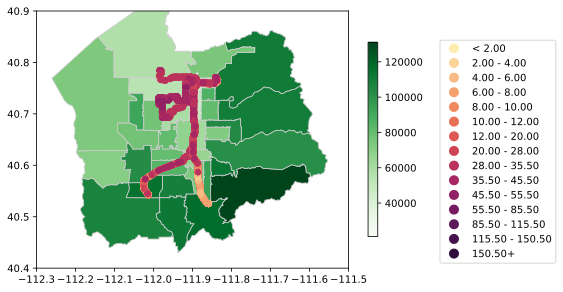

In [8]:
### Overlay AQ data on Income data ###

from palettable.cmocean.sequential import Matter_15
cmap=ListedColormap((Matter_15).mpl_colors)


fig, ax = plt.subplots(figsize=(7,7))

""" race_pop_gdf.plot(
    ax=ax,
    column='Perc_NonWhite',
    cmap='Purples', 
    linewidth=0.8, 
    edgecolor='0.8', 
    legend=True) """

median_hh_income_gdf.plot(
    ax=ax,
    column='Median_HH_Income', 
    cmap='Greens', 
    linewidth=0.8, 
    edgecolor='0.8', 
    legend=True,
    legend_kwds={'shrink': .5}
    )

geo_df.plot(
    ax=ax,
    column='Meso_West_Category',
    cmap=cmap,
    legend=True,
    #move location of legend
    legend_kwds={'loc': 'lower right', 'bbox_to_anchor': (1.68, 0)},
)


## Full Salt Lake County ##
plt.xlim(-112.3, -111.5)
plt.ylim(40.4, 40.9)

""" ## Downtown Salt Lake ##
plt.xlim(-112.03, -111.78)
plt.ylim(40.67, 40.8)
 """
#plt.xticks([])
#plt.yticks([])